In [1]:
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import pyabf


In [2]:
# Load it back from the file
with open("binned_waveforms.pkl", "rb") as f:
    binned_waveforms_old = pickle.load(f)

print("Loaded:", list(binned_waveforms_old.keys())[:5]) 

Loaded: [(np.float64(25.233409033558843), 'Excitatory', 'CaP', 'primary'), (np.float64(32.61578604044627), 'Excitatory', 'CaP', 'primary'), (np.float64(36.50967506389131), 'Excitatory', 'CaP', 'primary'), (np.float64(26.212319790300285), 'Excitatory', 'CaP', 'primary'), (np.float64(22.836263987212853), 'Excitatory', 'CaP', 'primary')]


In [3]:
with open("binned_waveforms_moreabfs.pkl", "rb") as f:
    binned_waveforms1 = pickle.load(f)

print("Loaded:", list(binned_waveforms1.keys())[:5])  # peek at a few keys


Loaded: [(np.float64(70.57163020465765), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(37.13330857779412), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(29.629629629631626), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(25.393600812594386), 'Inhibitory (Rs compensation)', 'CaP', 'primary'), (np.float64(26.773761713520752), 'Inhibitory (Rs compensation)', 'CaP', 'primary')]


In [4]:
print(len(binned_waveforms1.keys()))
print(len(binned_waveforms_old.keys()))

11557
14890


In [5]:
binned_waveforms_new = {}
binned_waveforms_new = binned_waveforms1 | binned_waveforms_old
print(len(binned_waveforms_new.keys()))

26447


In [6]:
for key, df in binned_waveforms_new.items():
    if df.shape != (50, 4):

        print(f"Key {key}: shape is incorrect {df.shape}")


Key (np.float64(7142.857142402511), 'Excitatory (Rs compensation)', 'vSMN', 'High Rin Secondary'): shape is incorrect (15, 4)


In [77]:
from collections import Counter

def get_freq_bin(freq):
    if 15 <= freq < 25:
        return "15–25"
    elif 25 <= freq < 35:
        return "25–35"
    elif 35 <= freq < 45:
        return "35–45"
    elif 45 <= freq < 65:
        return "45+"
    else:
        return "<15"

def group_iSMN(cell_type):
    if cell_type in ["iSMN (dorsal) muscle", "iSMN"]:
        return "iSMN"
    elif cell_type in ['vSMN ','vSMN']:
        return 'vSMN'
    return cell_type

def group_EI(signal_type):
    if signal_type in ["Inhibitory", "Inhibitory (Rs compensation)"]:
        return "Inhibitory"
    if signal_type in ["Excitatory", "Excitatory (Rs compensation)"]:
        return "Excitatory"
    return signal_type

key_counts_all = Counter()

for freq, signal_type, cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    signal_type_gen = group_EI(signal_type)
    grouped_key = (freq_bin, signal_type_gen, cell_type_gen, fast_slow)
    key_counts_all[grouped_key] += 1

In [78]:
key_counts_all

Counter({('25–35', 'Excitatory', 'MiP', 'primary'): 1286,
         ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary'): 1130,
         ('25–35', 'Inhibitory', 'vSMN', 'High Rin Secondary'): 1084,
         ('25–35', 'Excitatory', 'vRoP', 'primary'): 1038,
         ('15–25', 'Cell-attached', 'MiP', 'primary'): 986,
         ('25–35', 'Excitatory', 'vSMN', 'High Rin Secondary'): 950,
         ('25–35', 'Inhibitory', 'iSMN', 'High Rin Secondary'): 926,
         ('25–35', 'Cell-attached', 'MiP', 'primary'): 878,
         ('25–35', 'Inhibitory', 'dSMN', 'Low Rin Secondary '): 871,
         ('15–25', 'Cell-attached', 'CaP', 'primary'): 794,
         ('15–25', 'Excitatory', 'CaP', 'primary'): 727,
         ('25–35', 'Excitatory', 'CaP', 'primary'): 675,
         ('15–25', 'Excitatory', 'MiP', 'primary'): 647,
         ('25–35', 'Cell-attached', 'vRoP', 'primary'): 599,
         ('25–35', 'Excitatory', 'dRoP', 'primary'): 531,
         ('25–35', 'Cell-attached', 'vSMN', 'High Rin Secondary'):

In [82]:
average_waveforms_for_key(('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary'), binned_waveforms_new)

No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'High Rin Secondary')


In [29]:
list(key_counts_all.keys())[:5]

[('<15', 'Inhibitory', 'CaP', 'primary'),
 ('35–45', 'Inhibitory', 'CaP', 'primary'),
 ('25–35', 'Inhibitory', 'CaP', 'primary'),
 ('45+', 'Inhibitory', 'CaP', 'primary'),
 ('15–25', 'Inhibitory', 'CaP', 'primary')]

In [11]:
phase = np.arange(0.01, 1.00001, 0.02)
phase

array([0.01, 0.03, 0.05, ..., 0.95, 0.97, 0.99], shape=(50,))

In [73]:
keys_to_delete = [key for key, df in binned_waveforms.items() if df.shape != (50, 4)]

for key in keys_to_delete:
    print(f"Deleting key due to unexpected shape {binned_waveforms_new[key].shape}: {key}")
    del binned_waveforms_new[key]


Deleting key due to unexpected shape (15, 4): (np.float64(7142.857142402511), 'Excitatory (Rs compensation)', 'vSMN', 'High Rin Secondary')


In [81]:
def average_waveforms_for_key(counter_key,binned):
    '''
    Function that takes a counter key like ('15–25', 'Cell-attached', 'MiP', 'primary')
    Returns a DataFrame with mean and SEM of normalized current for that key
    '''
    import numpy as np
    phase = np.arange(0.01, 1.00001, 0.02)

    # Separate key code
    freq_bin, signal_type, cell_type, fast_slow = counter_key

    dfs = []  # To store matching waveform dataframes
    # loop through all binned waveforms
    for key in binned.keys():
        freq, st, ct, fs = key
        # Check dataframe shape before anything else

        # use get_freq_bin(freq) to turn float into bin, use group_iSMN() to generalize all iSMN
        if get_freq_bin(freq) == freq_bin and ct == group_iSMN(cell_type) and st == group_EI(signal_type) and fs == fast_slow:
            df = binned[key].copy()
            df['Phase'] = phase
            dfs.append(df)

    # if no waveforms for key
    if not dfs:
        print(f"No matching waveforms found for {counter_key}")
        return None
        

    combined = pd.concat(dfs)

    # Compute mean and SEM per phase bin
    grouped = combined.groupby('Phase', observed=False)['Normalized Current']
    averaged = grouped.mean().reset_index(name='Normalized Current')
    sem = grouped.sem().reset_index(name='SEM')
    # Ensure SEM is float type
    sem['SEM'] = sem['SEM'].astype(float)
    # Merge mean and SEM into a single DataFrame
    result = pd.merge(averaged, sem, on='Phase')
    return result


In [15]:
one_counter_key = list(key_counts_all.keys())[7]
ex_avg_df = average_waveforms_for_key(one_counter_key)
ex_avg_df

,Phase,Normalized Current,SEM
0,0.01,0.641312,0.011951
1,0.03,0.621092,0.011204
2,0.05,0.612888,0.010923
3,0.07,0.606836,0.011089
4,0.09,0.577112,0.010916
5,0.11,0.570653,0.011077
6,0.13,0.565402,0.010599
7,0.15,0.554124,0.011177
8,0.17,0.545010,0.011166
9,0.19,0.540021,0.010889


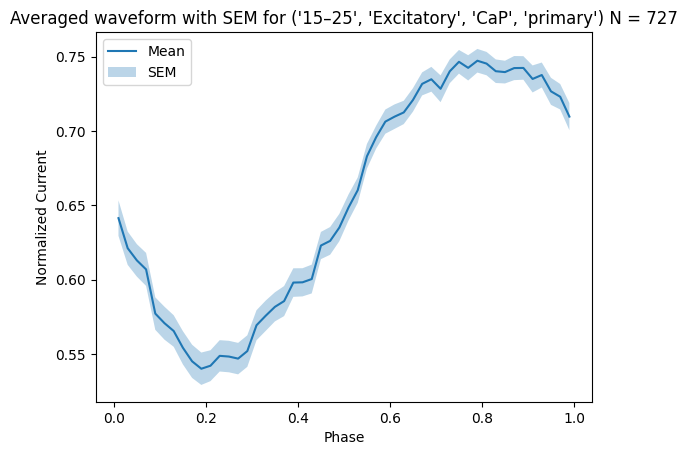

In [30]:
def plot_avg_wf(avg_waveform_df,key):
    count = key_counts_all[key]  # Get count for current key

    if avg_waveform_df is not None:
        plt.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label='Mean')
        plt.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        alpha=0.3, label='SEM')
        plt.xlabel('Phase')
        plt.ylabel('Normalized Current')
        plt.title(f'Averaged waveform with SEM for {key} N = {count}')
        plt.legend()
        plt.show()

plot_avg_wf(ex_avg_df,one_counter_key)

In [37]:
# Initialize sets for each key component
freq_bins = set()
signal_types = set()
cell_types = set()
fast_slow_types = set()

# Loop through all keys in key_counts_all
for freq_bin, signal_type, cell_type, fast_slow in key_counts_all.keys():
    freq_bins.add(freq_bin)
    signal_types.add(signal_type)
    cell_types.add(cell_type)
    fast_slow_types.add(fast_slow)

# Convert sets to sorted lists (optional)
freq_bins = sorted(freq_bins)
signal_types = sorted(signal_types)
cell_types = sorted(cell_types)
fast_slow_types = sorted(fast_slow_types)

# Print or return
print("Frequency Bins:", freq_bins)
print("Signal Types:", signal_types)
print("Cell Types:", cell_types)
print("Fast/Slow Types:", fast_slow_types)
freq_bins.remove('<15')
signal_types.remove('Cell-attached')



Frequency Bins: ['15–25', '25–35', '35–45', '45+', '<15']
Signal Types: ['Cell-attached', 'Excitatory', 'Inhibitory']
Cell Types: ['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']
Fast/Slow Types: ['High Rin Secondary', 'Low Rin Secondary ', 'primary']


In [44]:
# Convert sets to sorted lists (optional)
freq_bins = sorted(freq_bins)
signal_types = sorted(signal_types)
cell_types = sorted(cell_types)
fast_slow_types = sorted(fast_slow_types)

# Print or return
print("Frequency Bins:", freq_bins)
print("Signal Types:", signal_types)
print("Cell Types:", cell_types)
print("Fast/Slow Types:", fast_slow_types)


Frequency Bins: ['15–25', '25–35', '35–45', '45+']
Signal Types: ['Excitatory', 'Inhibitory']
Cell Types: ['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']
Fast/Slow Types: ['High Rin Secondary', 'Low Rin Secondary ', 'primary']


In [ ]:
for freq, signal_type, cell_type, fast_slow in binned_waveforms.keys():
    freq_bin = get_freq_bin(freq)
    cell_type_gen = group_iSMN(cell_type)
    signal_type_gen = group_EI(signal_type)
    grouped_key = (freq_bin, signal_type_gen, cell_type_gen, fast_slow)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/3154665450.py:12: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


No matching waveforms found for ('15–25', 'Excitatory', 'CaP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'MiP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dVS', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'MiP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dS

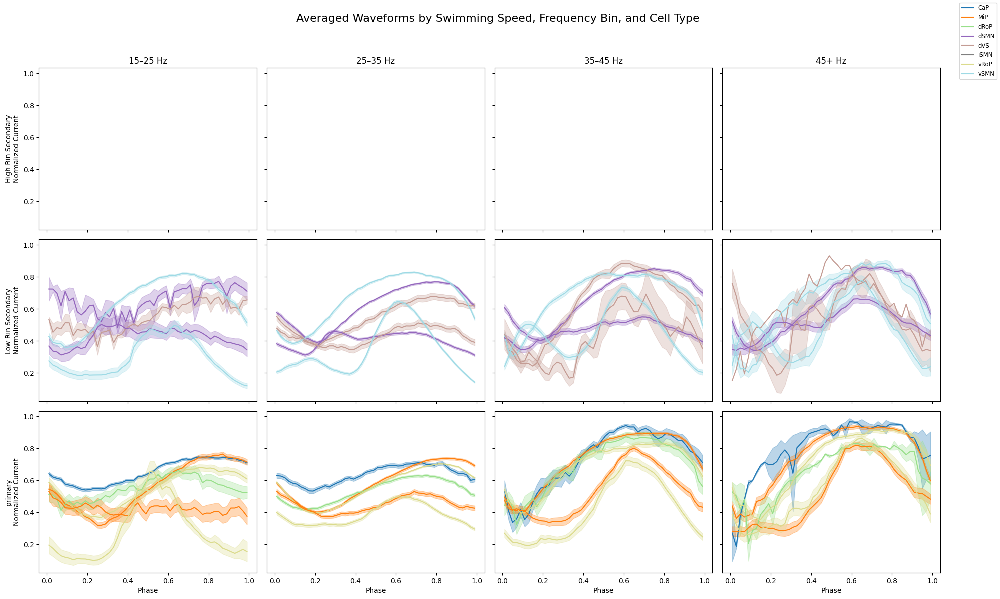

In [60]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Frequency bins and swimming speed categories





# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(fast_slow_types), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

for i, speed in enumerate(fast_slow_types):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            for cell_type in cell_types:
                counter_key = (freq_bin, signal_type, cell_type, speed)
                avg_waveform_df = average_waveforms_for_key(counter_key,binned_waveforms)
                if avg_waveform_df is None or avg_waveform_df.empty:
                    continue

                label = f"{cell_type} ({signal_type})"
                ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                        label=label, color=cell_type_colors[cell_type])
                ax.fill_between(avg_waveform_df['Phase'],
                                avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                                avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                                color=cell_type_colors[cell_type], alpha=0.3)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(fast_slow_types) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend
handles, labels = [], []
for ctype in cell_types:
    handles.append(plt.Line2D([0], [0], color=cell_type_colors[ctype]))
    labels.append(ctype)
fig.legend(handles, labels, loc='upper right', fontsize='small')

fig.suptitle("Averaged Waveforms by Swimming Speed, Frequency Bin, and Cell Type", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/318477082.py:13: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


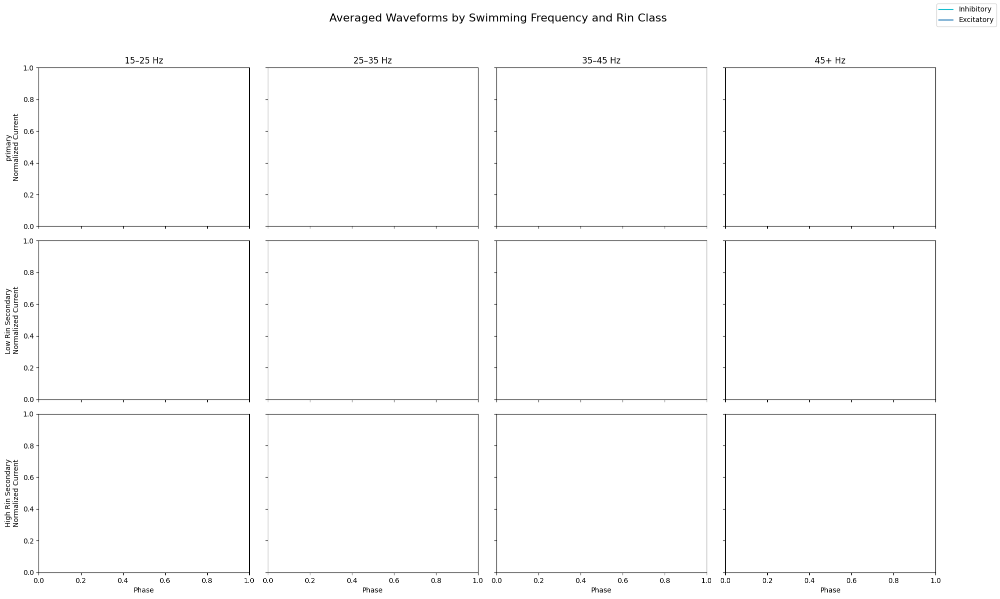

In [76]:
import matplotlib.pyplot as plt
from collections import defaultdict
import matplotlib.cm as cm
import numpy as np
import pandas as pd

# Frequency bins and swimming speed categories
freq_bins = ["15–25", "25–35", "35–45", "45+"]
speed_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Track which labels have been used to avoid duplicates in the legend
used_labels = set()
count = 0
# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Construct the key without cell type
            matching_keys = [key for key in binned_waveforms1.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            dfs = [binned_waveforms1[key].copy() for key in matching_keys]
            if not dfs:
                continue
            count += 1
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles, labels = [], []
for stype in signal_types:
    handles.append(plt.Line2D([0], [0], color=signal_type_colors[stype]))
    labels.append(stype)
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Frequency and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


In [51]:
for i, speed in enumerate(fast_slow_types):
    print(i,speed)

0 High Rin Secondary
1 Low Rin Secondary 
2 primary


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/2803642069.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(cell_types))


No matching waveforms found for ('15–25', 'Excitatory', 'CaP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'MiP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'dVS', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'MiP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dRoP', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dS

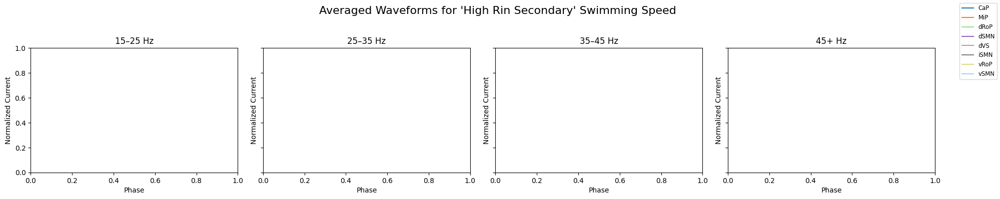

In [61]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

# Pick one swimming speed category
selected_speed = "High Rin Secondary"  # Change to "secondary" if you want the other one

# Assign unique colors to each cell type
cmap = cm.get_cmap('tab20', len(cell_types))
cell_type_colors = {ctype: cmap(i) for i, ctype in enumerate(cell_types)}

# Create 1xN subplots: one row (for the selected speed), N columns = frequency bins
fig, axes = plt.subplots(1, len(freq_bins), figsize=(20, 4), sharex=True, sharey=True)

# If only one subplot is returned (when len(freq_bins) == 1), put it in a list for consistency
if len(freq_bins) == 1:
    axes = [axes]

for j, freq_bin in enumerate(freq_bins):
    ax = axes[j]

    for signal_type in signal_types:
        for cell_type in cell_types:
            counter_key = (freq_bin, signal_type, cell_type, selected_speed)
            avg_waveform_df = average_waveforms_for_key(counter_key,binned_waveforms1)
            if avg_waveform_df is None or avg_waveform_df.empty:
                continue

            label = f"{cell_type} ({signal_type})"
            ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'],
                    label=label, color=cell_type_colors[cell_type])
            ax.fill_between(avg_waveform_df['Phase'],
                            avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                            avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                            color=cell_type_colors[cell_type], alpha=0.3)

    # Add titles and labels
    ax.set_title(f"{freq_bin} Hz")
    ax.set_xlabel("Phase")
    ax.set_ylabel("Normalized Current")

# Add legend
handles, labels = [], []
for ctype in cell_types:
    handles.append(plt.Line2D([0], [0], color=cell_type_colors[ctype]))
    labels.append(ctype)
fig.legend(handles, labels, loc='upper right', fontsize='small')

fig.suptitle(f"Averaged Waveforms for '{selected_speed}' Swimming Speed", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


In [45]:
# Convert sets to sorted lists (optional)
freq_bins = sorted(freq_bins)
signal_types = sorted(signal_types)
cell_types = sorted(cell_types)
fast_slow_types = sorted(fast_slow_types)

# Print or return
print("Frequency Bins:", freq_bins)
print("Signal Types:", signal_types)
print("Cell Types:", cell_types)
print("Fast/Slow Types:", fast_slow_types)


Frequency Bins: ['15–25', '25–35', '35–45', '45+']
Signal Types: ['Excitatory', 'Inhibitory']
Cell Types: ['CaP', 'MiP', 'dRoP', 'dSMN', 'dVS', 'iSMN', 'vRoP', 'vSMN']
Fast/Slow Types: ['High Rin Secondary', 'Low Rin Secondary ', 'primary']


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/4255272437.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


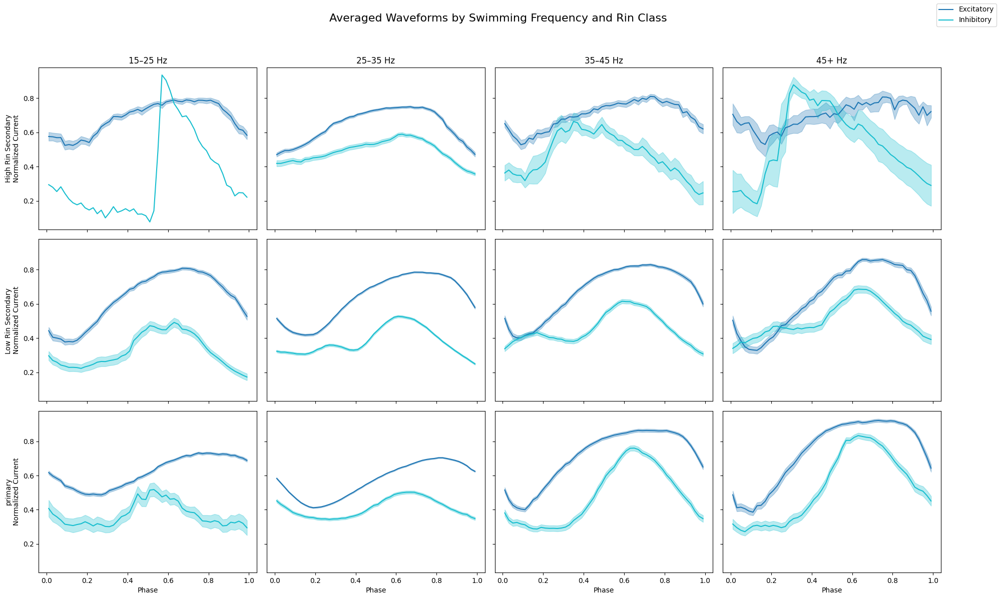

In [69]:
import matplotlib.cm as cm

# Frequency bins and swimming speed categories
speed_categories = fast_slow_types

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

# Track which labels have been used to avoid duplicates in the legend
used_labels = set()
count = 0
# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Construct the key without cell type
            matching_keys = [key for key in binned_waveforms.keys()
                             if get_freq_bin(key[0]) == freq_bin and
                                key[1] == signal_type and
                                key[3] == speed]
            dfs = [binned_waveforms[key].copy() for key in matching_keys]
            if not dfs:
                continue
            count += 1
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and add legend to the figure
handles, labels = [], []
for stype in signal_types:
    handles.append(plt.Line2D([0], [0], color=signal_type_colors[stype]))
    labels.append(stype)
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Frequency and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/1153346295.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))


No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('35–45', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('45+', 'Inhibitory', 'iSMN', 'primary')
No matching waveforms found for ('45+', 'Excitatory', 'iSMN', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'iSMN', 'Low Rin Secondary ')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'Low Rin Secondary ')
No matching waveforms found for ('25–35', 'Inhibitory', 'iSMN', 'Low Rin Secondary ')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN', 'Low Rin Secondary ')
No matching waveforms found for ('35–45', 'Inhibitory', 'iSM

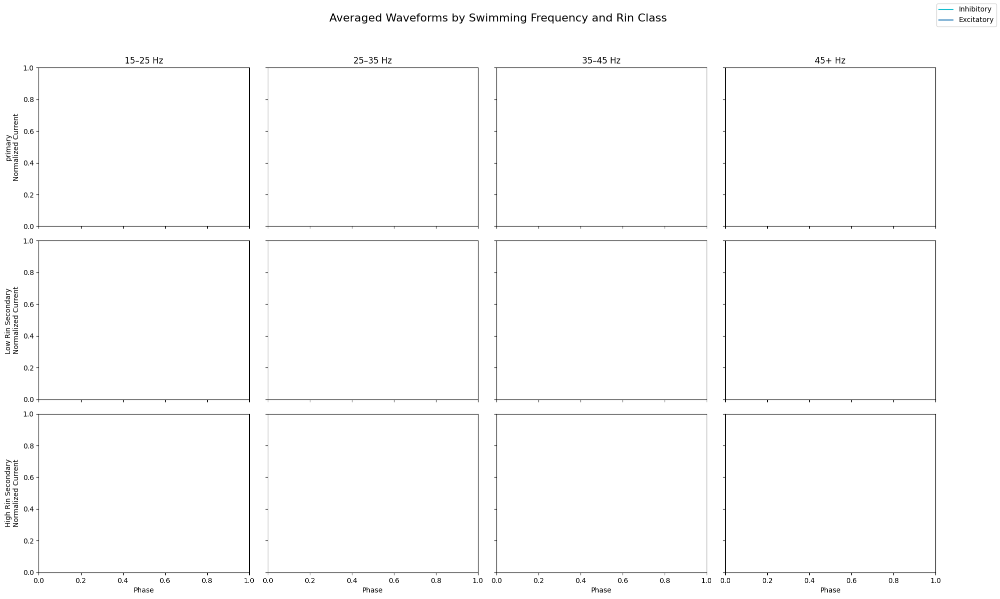

In [36]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm

# Frequency bins and swimming speed categories


# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

# Create 3x4 subplots: rows = swimming speeds, columns = frequency bins
fig, axes = plt.subplots(len(speed_categories), len(freq_bins), figsize=(20, 12), sharex=True, sharey=True)

used_labels = set()

# Loop through each combination of speed and frequency bin
for i, speed in enumerate(speed_categories):
    for j, freq_bin in enumerate(freq_bins):
        ax = axes[i, j]

        for signal_type in signal_types:
            # Try each general iSMN cell type
            for cell_type in ['iSMN']:  # Replace or extend with other generalized groups if needed
                counter_key = (freq_bin, signal_type, cell_type, speed)
                result_df = average_waveforms_for_key(counter_key)

                if result_df is None:
                    continue

                label = signal_type if signal_type not in used_labels else None

                ax.plot(result_df['Phase'], result_df['Normalized Current'],
                        label=label, color=signal_type_colors[signal_type])
                ax.fill_between(result_df['Phase'],
                                result_df['Normalized Current'] - result_df['SEM'],
                                result_df['Normalized Current'] + result_df['SEM'],
                                color=signal_type_colors[signal_type], alpha=0.3)
                used_labels.add(signal_type)

        # Add subplot title and labels
        if i == 0:
            ax.set_title(f"{freq_bin} Hz")
        if j == 0:
            ax.set_ylabel(f"{speed}\nNormalized Current")
        if i == len(speed_categories) - 1:
            ax.set_xlabel("Phase")

# Finalize layout and legend
handles, labels = [], []
for stype in signal_types:
    handles.append(plt.Line2D([0], [0], color=signal_type_colors[stype]))
    labels.append(stype)
fig.legend(handles, labels, loc='upper right')
fig.suptitle("Averaged Waveforms by Swimming Frequency and Rin Class", fontsize=16)
plt.tight_layout(rect=[0, 0, 0.95, 0.95])
plt.show()


/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/730917152.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab20', len(keys))


No matching waveforms found for ('<15', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('35–45', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('45+', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'Low Rin Secondary ')
No matching waveforms found for ('35–45', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_78982/730917152.py:32: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout(rect=[0, 0, 0.8, 1])


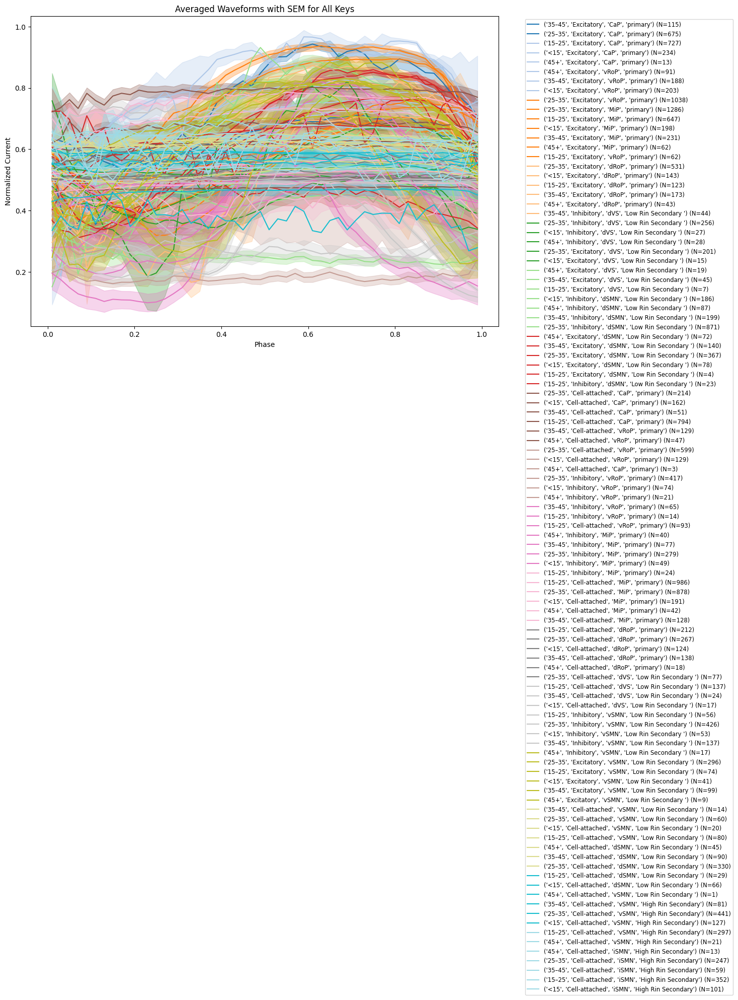

In [39]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

# Set up color map based on number of unique keys
keys = list(key_counts_all.keys())
cmap = cm.get_cmap('tab20', len(keys))

# Create a single figure
fig, ax = plt.subplots(figsize=(12, 8))

# Plot each waveform on the same axis
for idx, key in enumerate(keys):
    count = key_counts_all[key]
    avg_waveform_df = average_waveforms_for_key(key)

    if avg_waveform_df is not None:
        color = cmap(idx)
        label = f"{key} (N={count})"

        ax.plot(avg_waveform_df['Phase'], avg_waveform_df['Normalized Current'], label=label, color=color)
        ax.fill_between(avg_waveform_df['Phase'],
                        avg_waveform_df['Normalized Current'] - avg_waveform_df['SEM'],
                        avg_waveform_df['Normalized Current'] + avg_waveform_df['SEM'],
                        color=color, alpha=0.3)

# Label and title
ax.set_xlabel('Phase')
ax.set_ylabel('Normalized Current')
ax.set_title('Averaged Waveforms with SEM for All Keys')
ax.legend(fontsize='small', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout(rect=[0, 0, 0.8, 1])
plt.show()


No matching waveforms found for ('<15', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('35–45', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('25–35', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('45+', 'Inhibitory', 'CaP', 'primary')
No matching waveforms found for ('15–25', 'Inhibitory', 'CaP', 'primary')


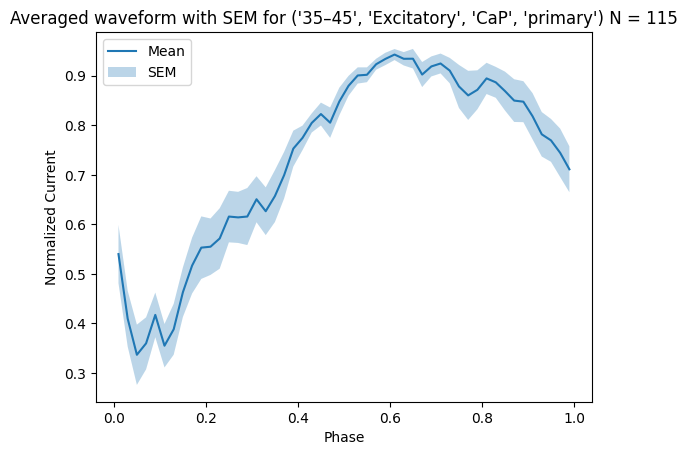

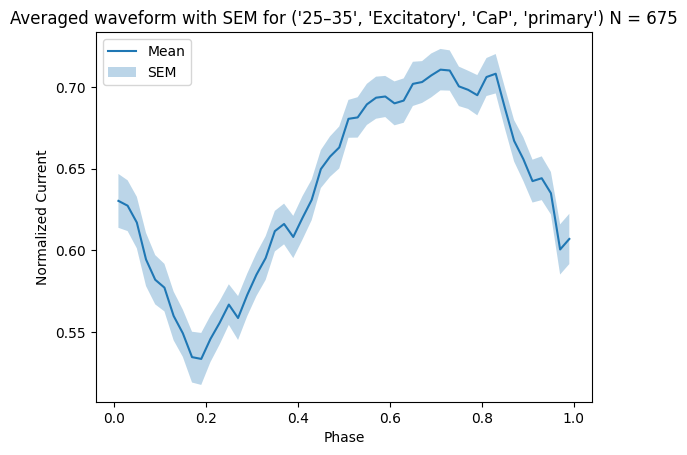

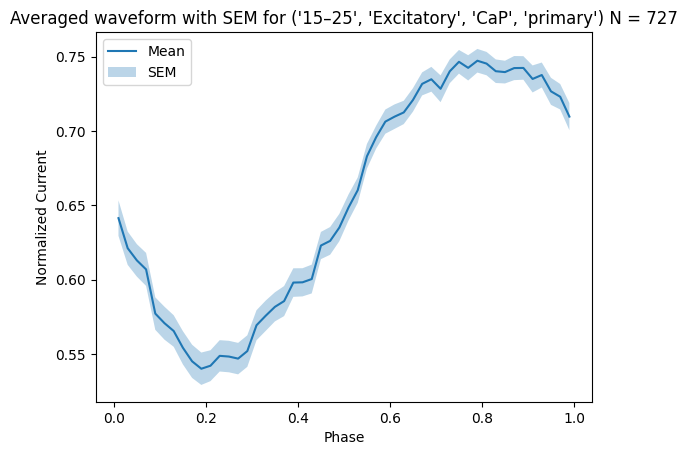

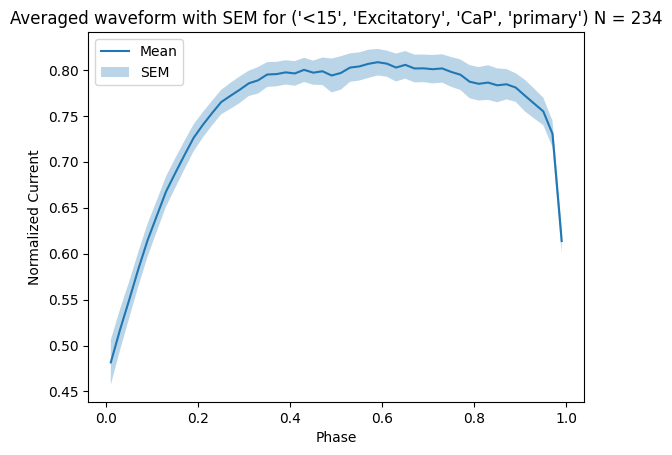

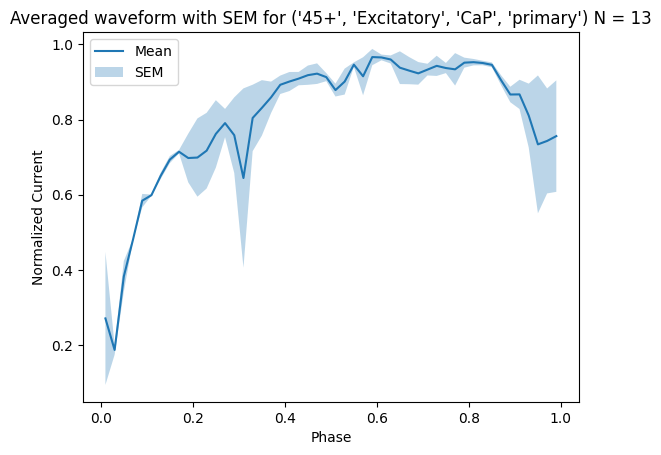

...

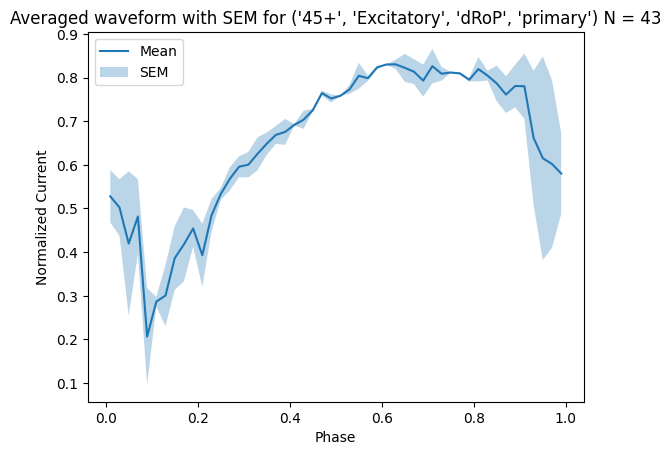

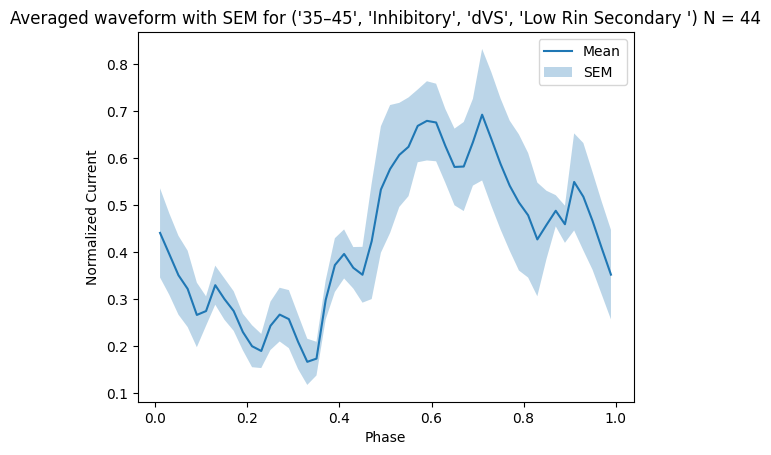

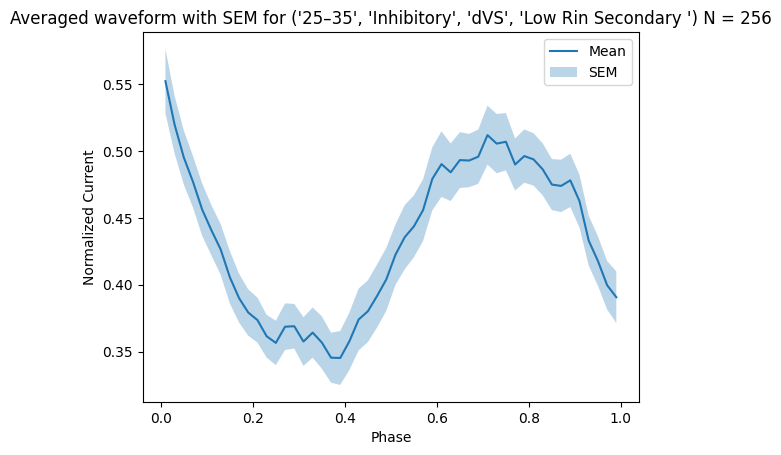

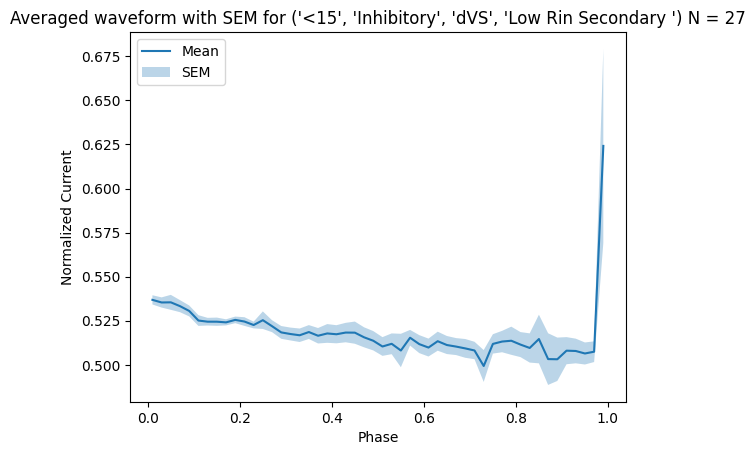

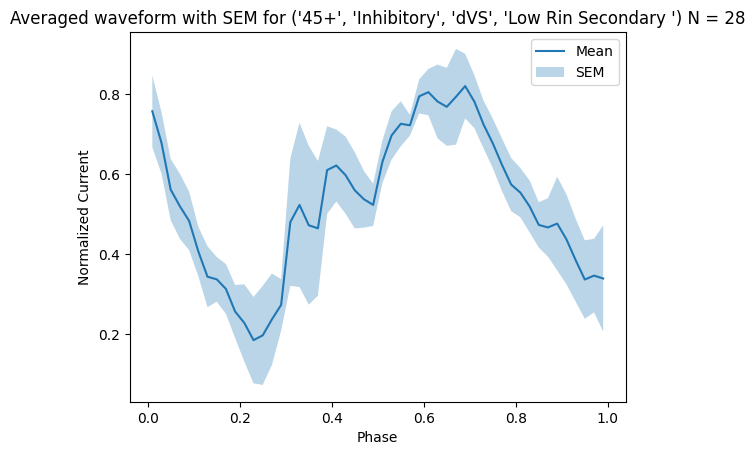

No matching waveforms found for ('15–25', 'Inhibitory', 'dVS', 'Low Rin Secondary ')


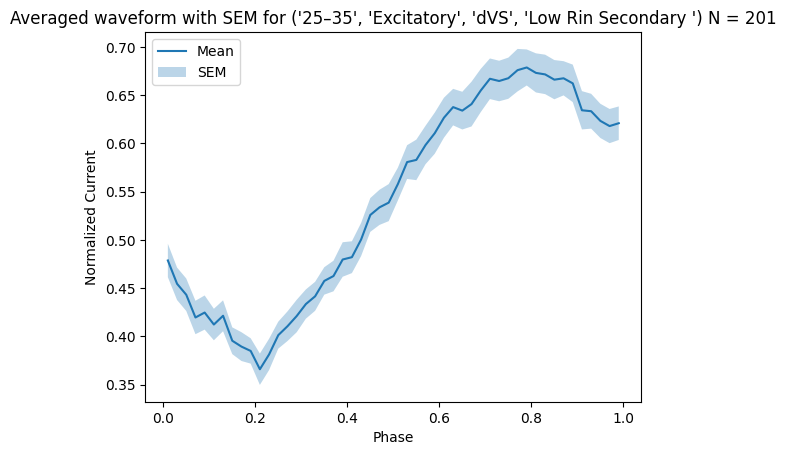

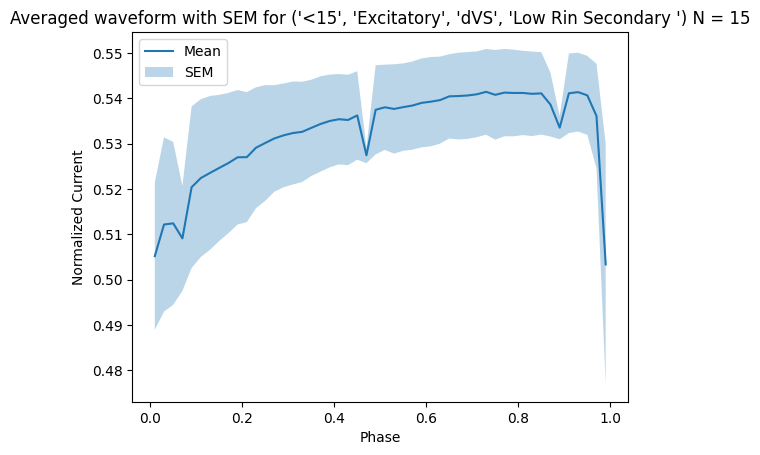

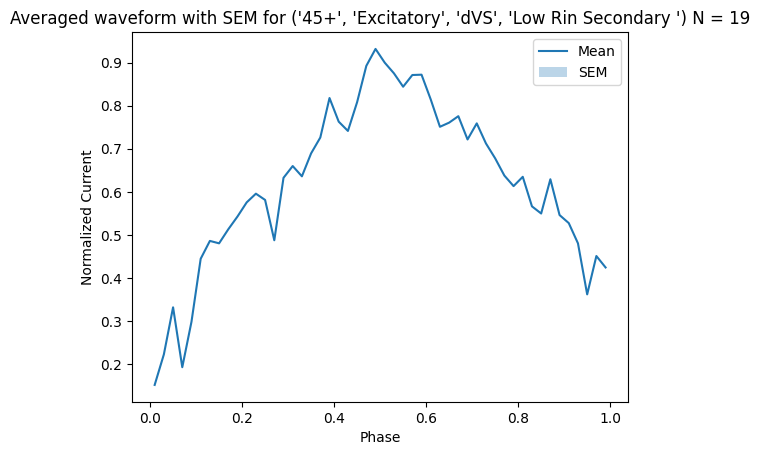

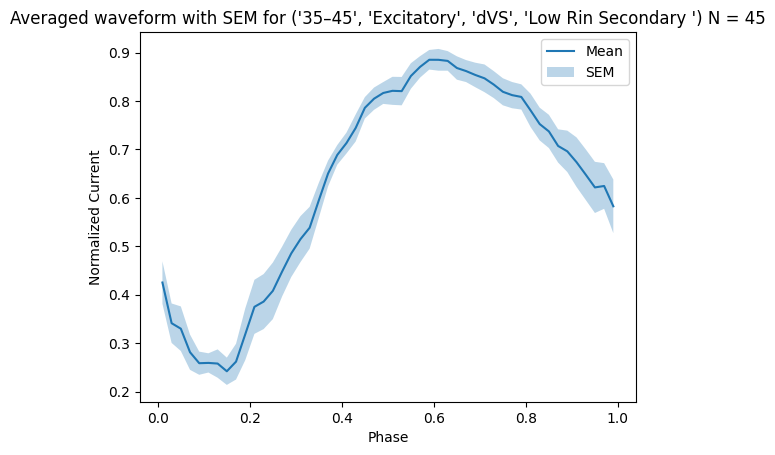

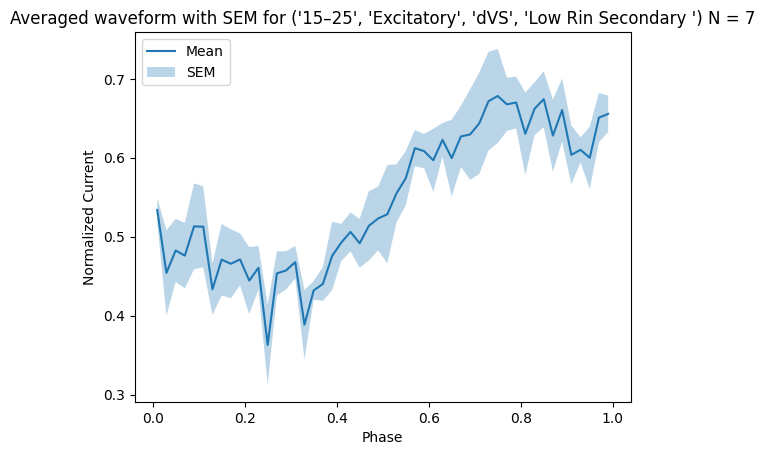

...

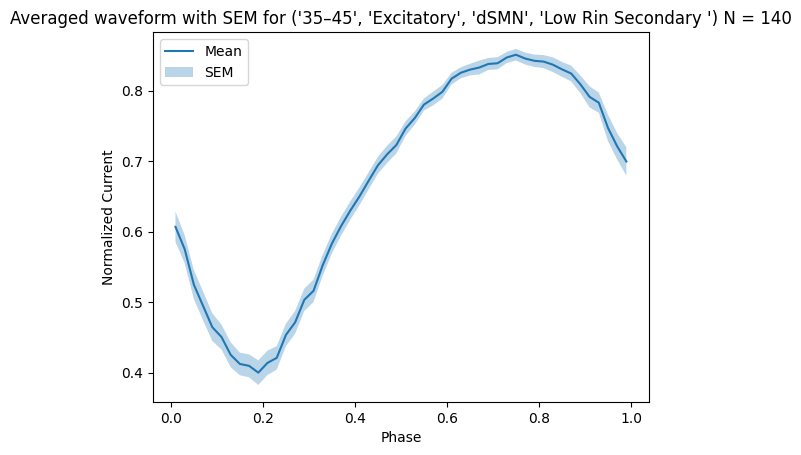

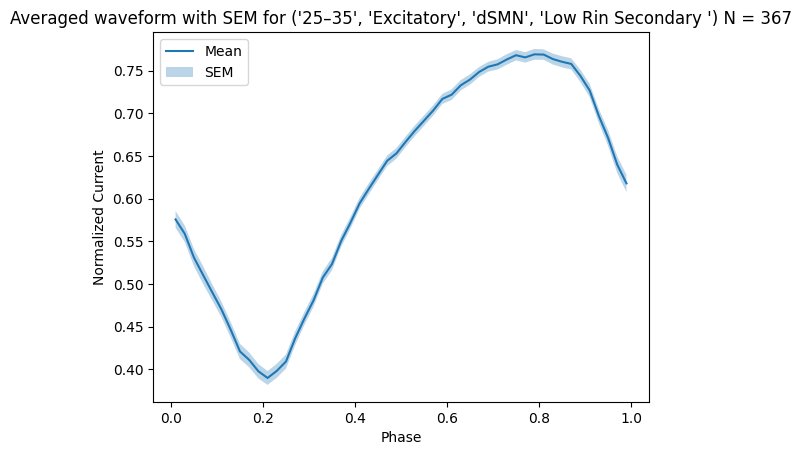

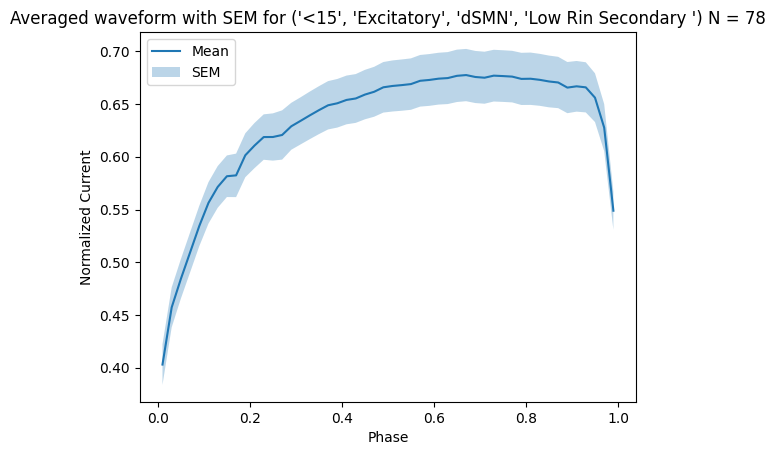

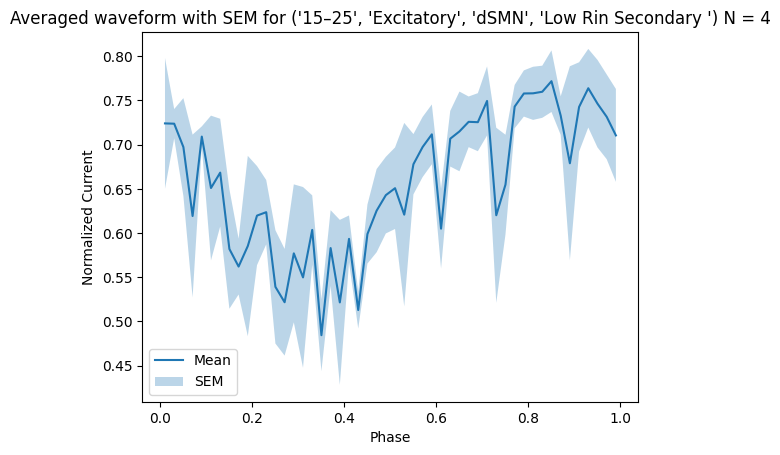

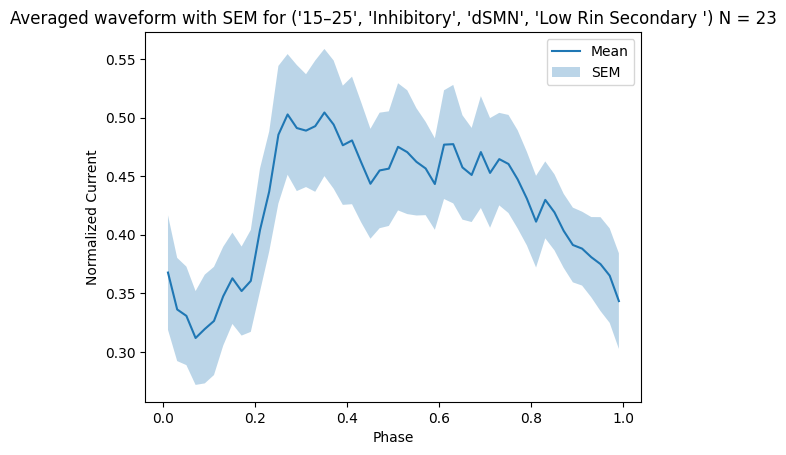

No matching waveforms found for ('35–45', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('35–45', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('45+', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('<15', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Inhibitory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'vSMN', 'High Rin Secondary')
No matching waveforms found for ('15–25', 'Excitatory', 'iSMN', 'High Rin Secondary')
No matching waveforms found for ('25–35', 'Excitatory', 'iSMN'

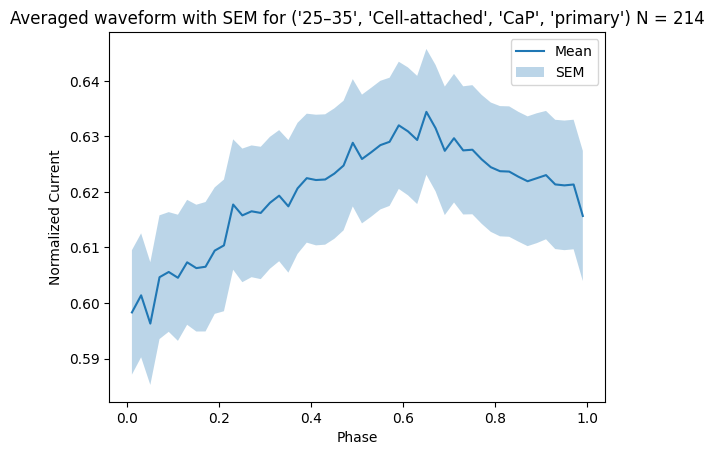

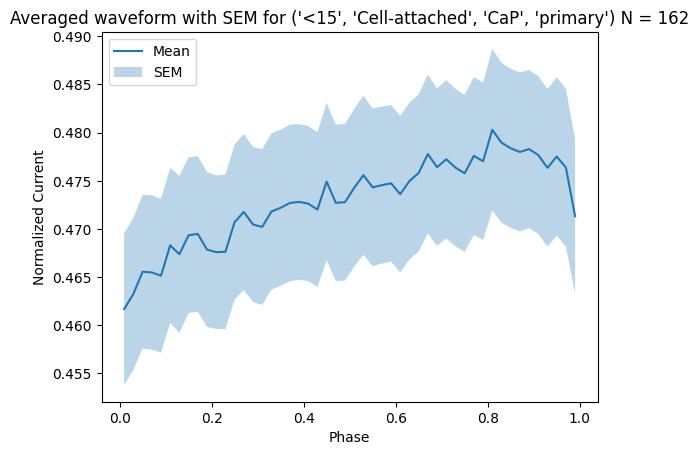

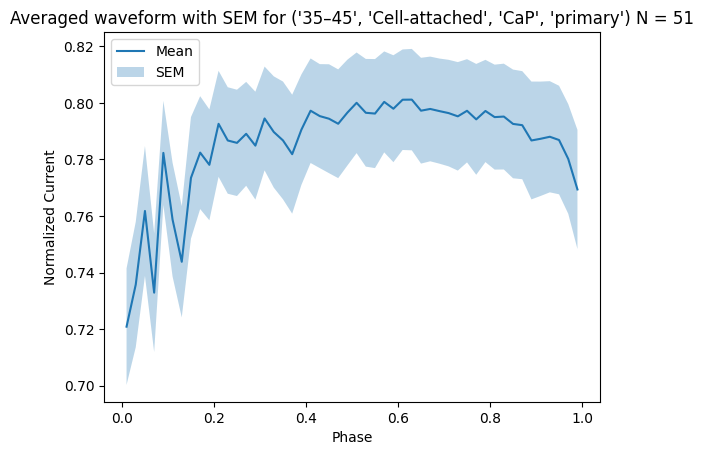

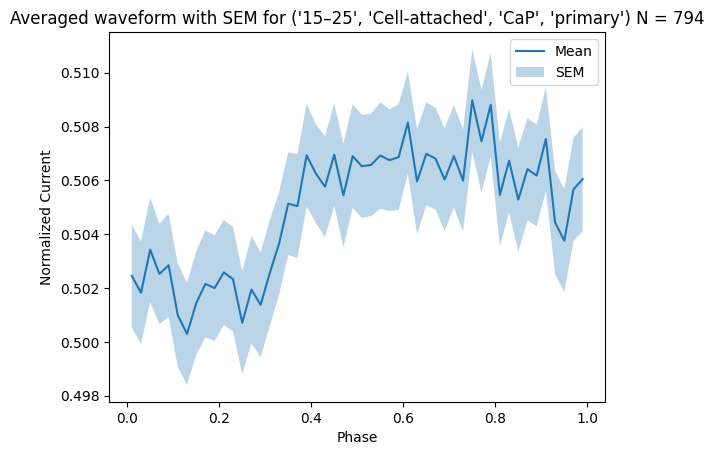

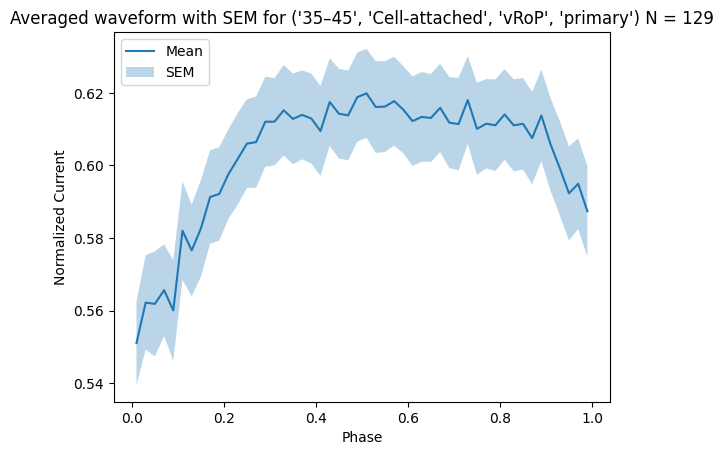

...

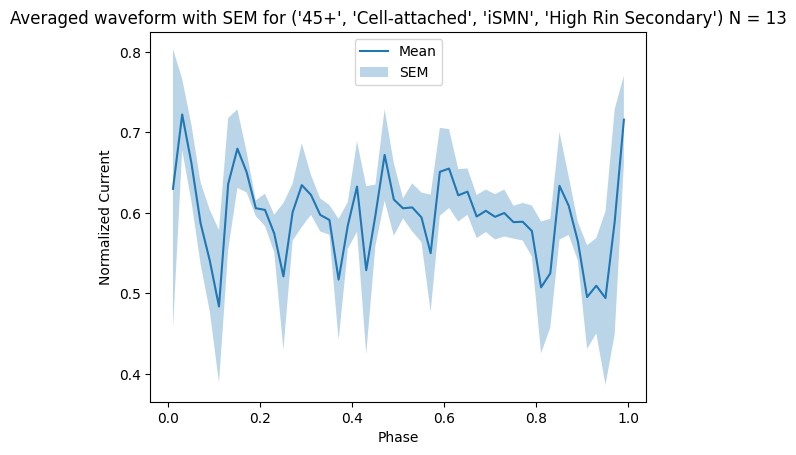

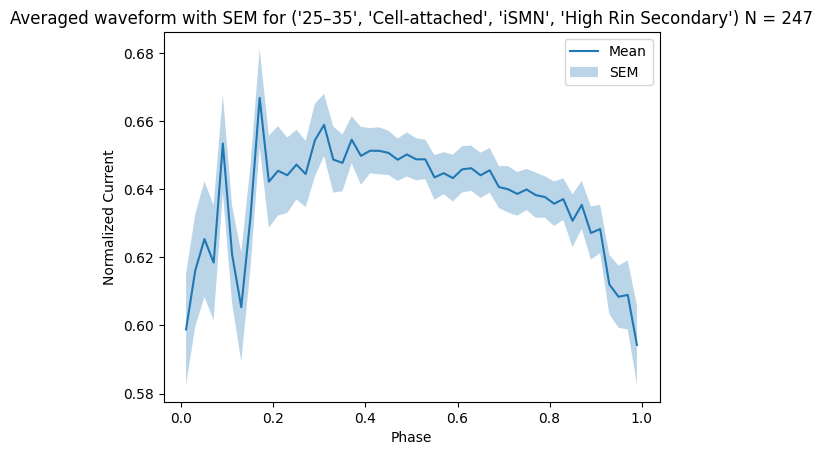

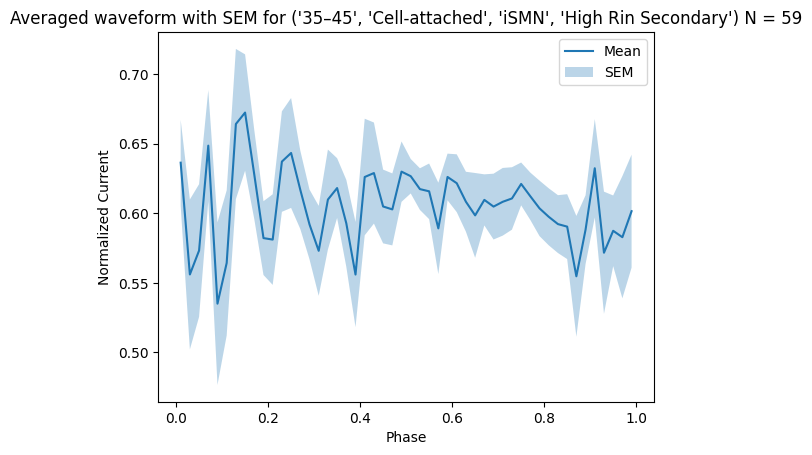

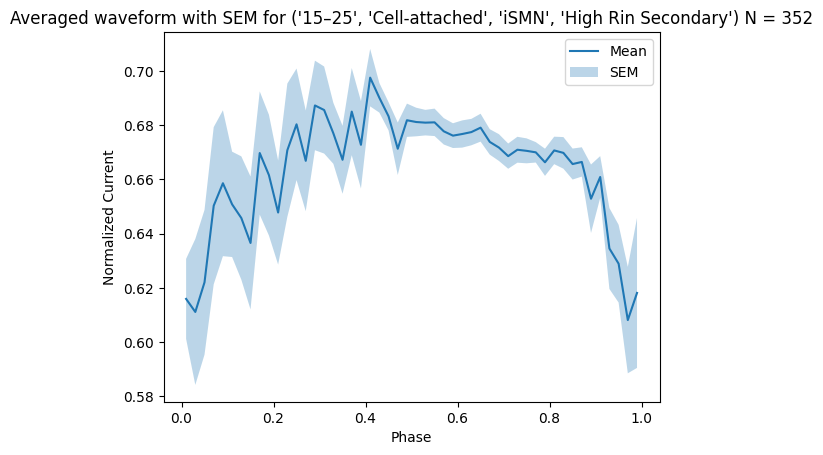

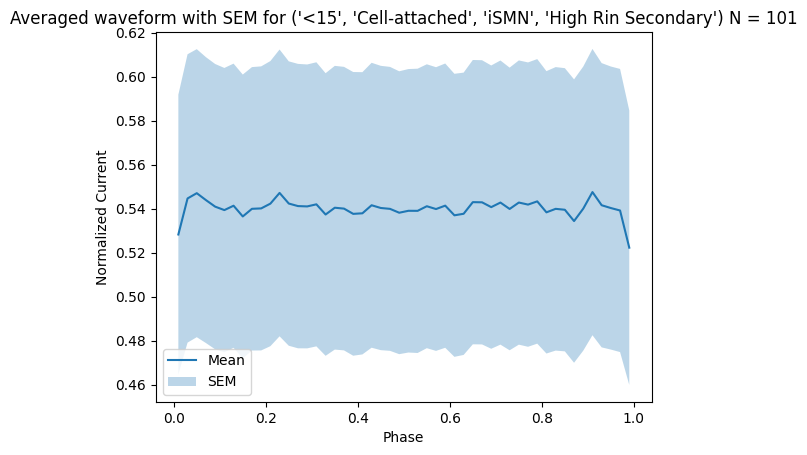

In [40]:
for key in key_counts_all.keys():
    count = key_counts_all[key]  # Get count for current key
    avg_waveform_df = average_waveforms_for_key(key)
    plot_avg_wf(avg_waveform_df,key)

/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_74614/1796533653.py:10: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = cm.get_cmap('tab10', len(signal_types))
/var/folders/40/qf3btjqs32l1pmzzyts7w9pmh2xrdg/T/ipykernel_74614/1796533653.py:51: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  ax.legend(fontsize='small')


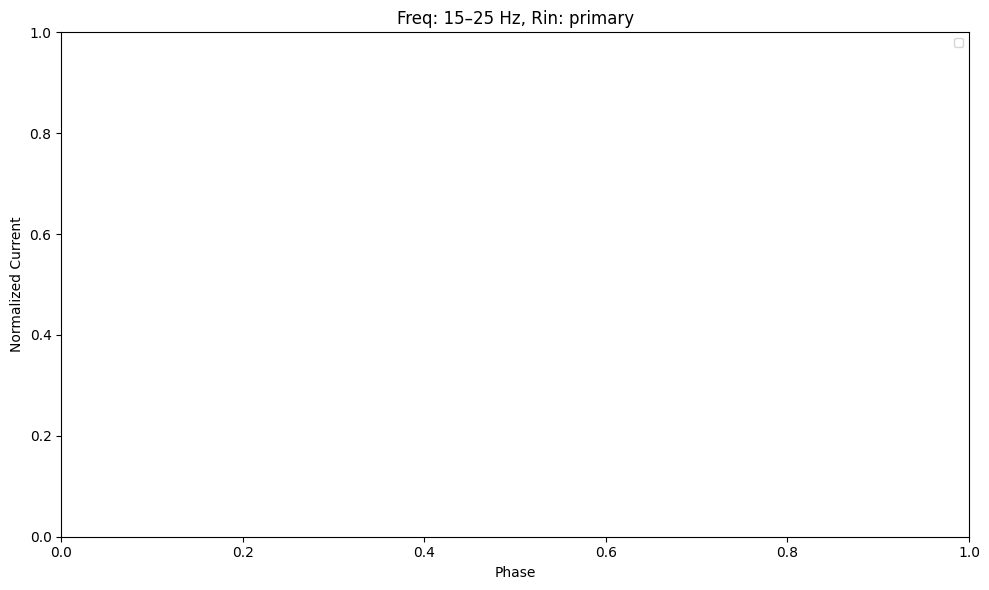

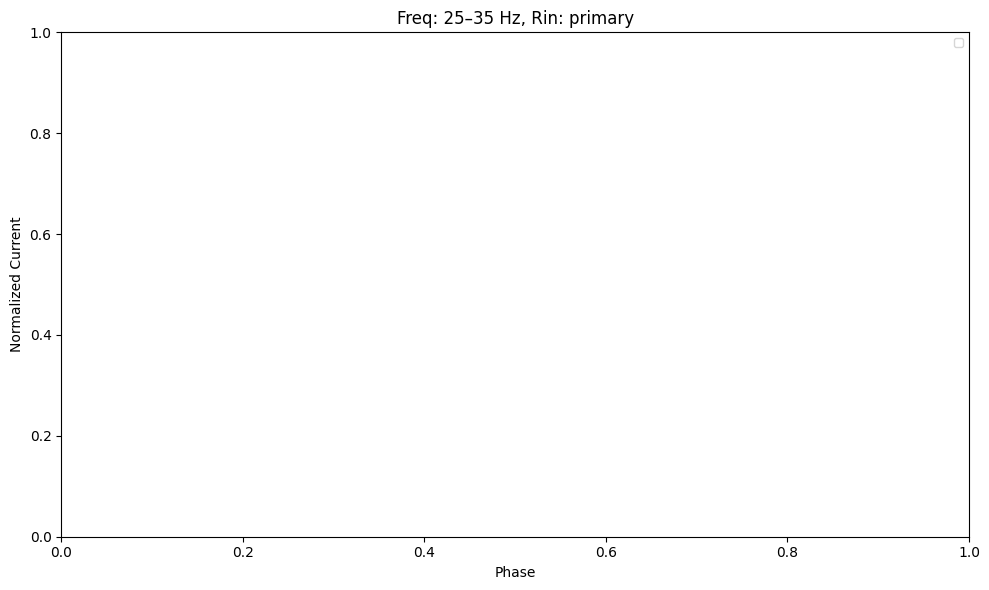

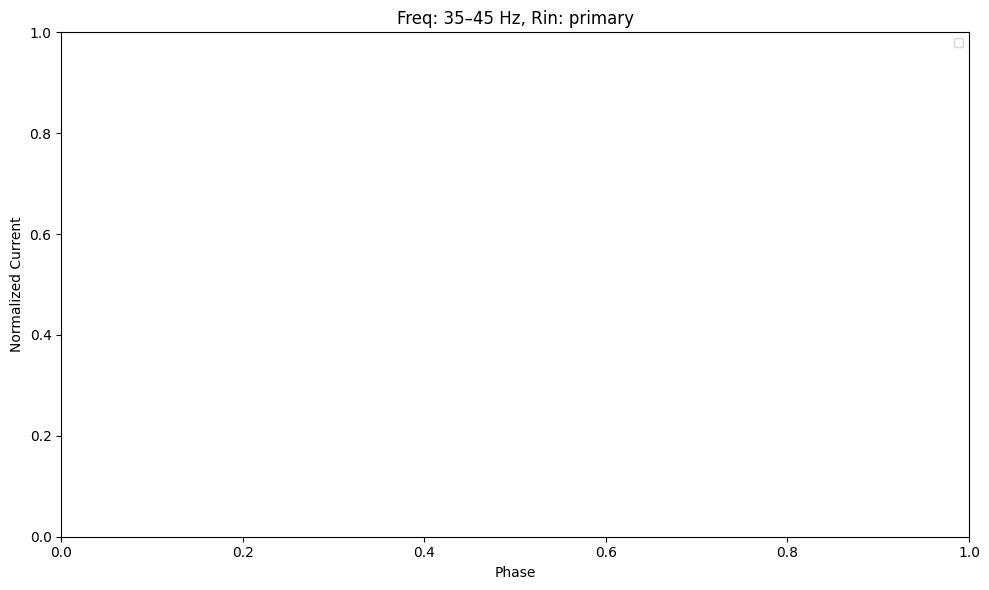

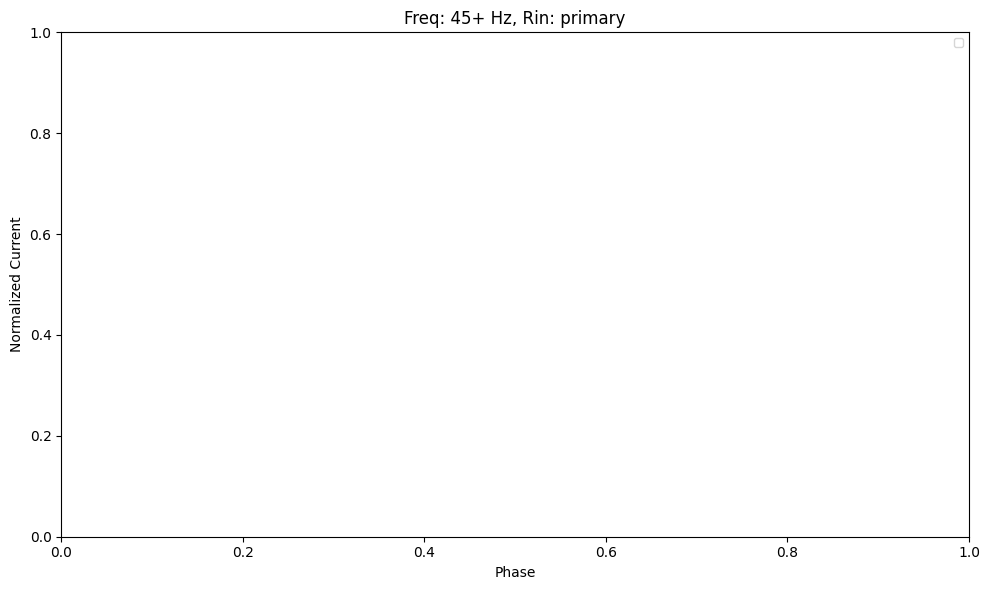

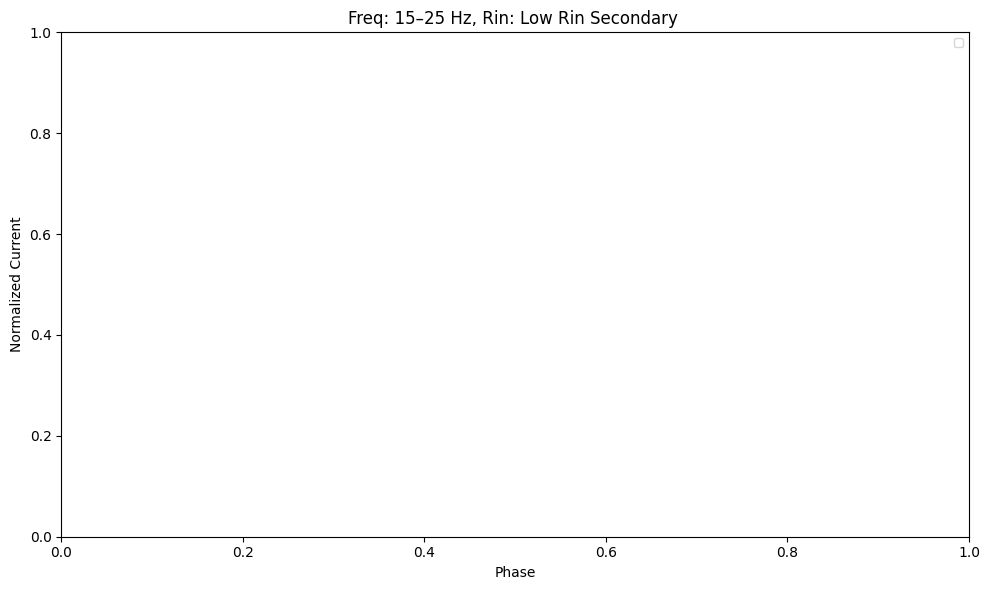

...

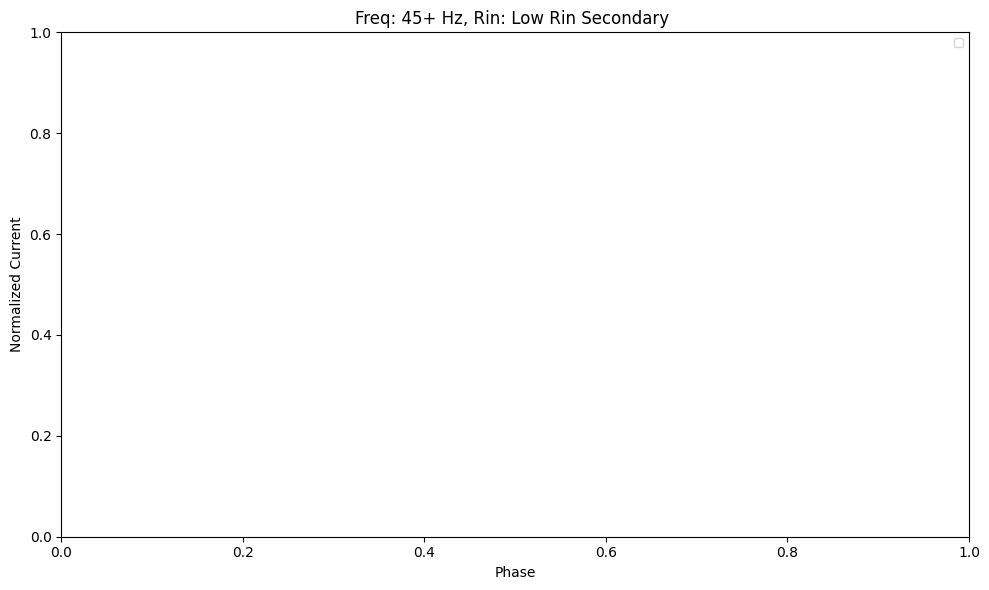

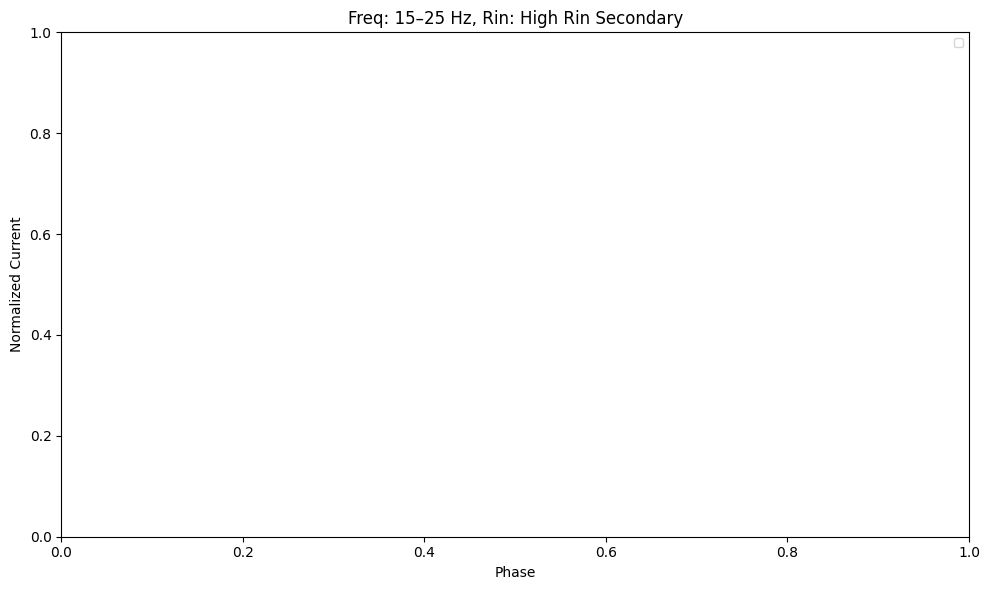

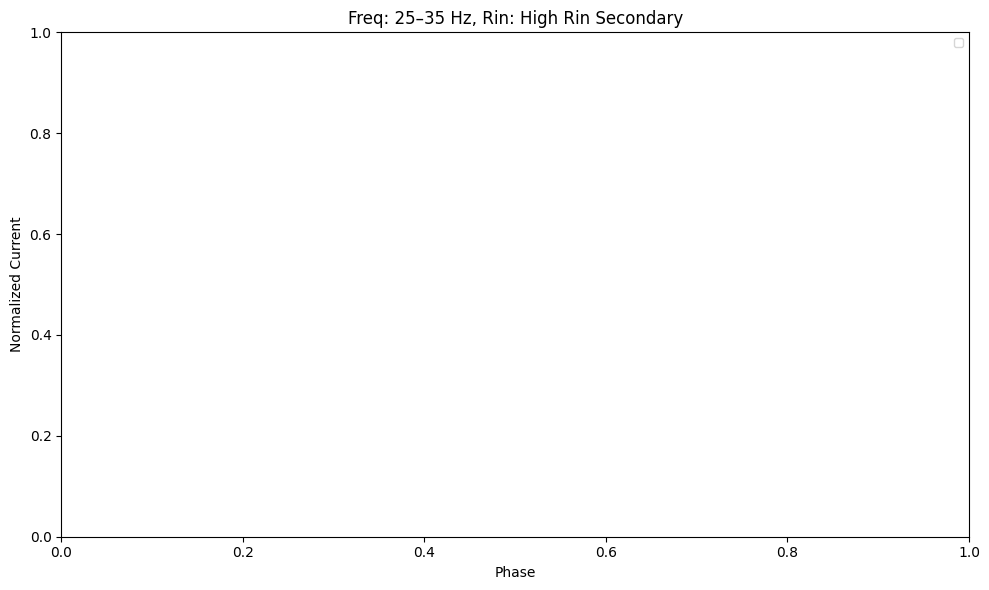

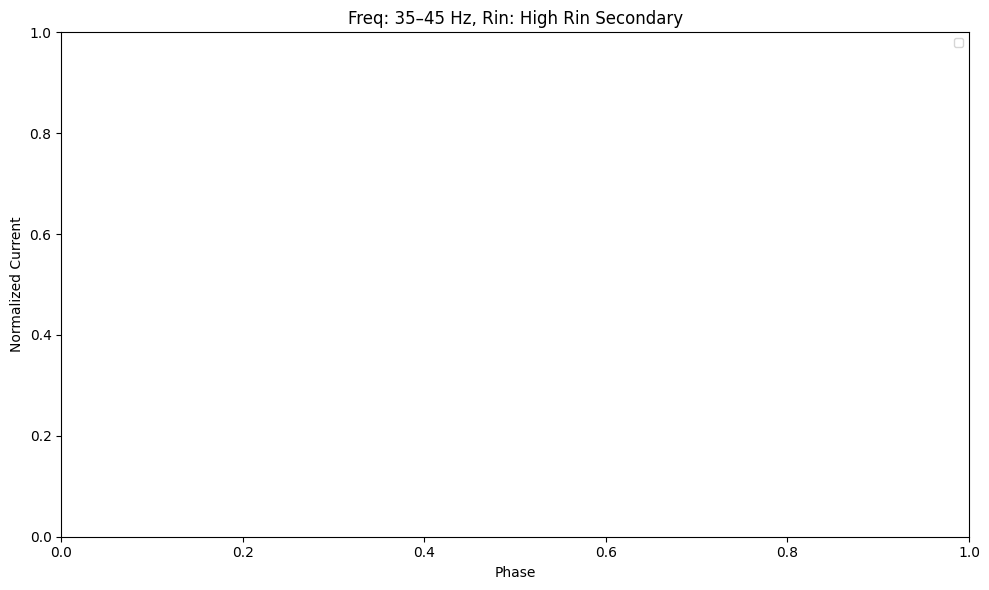

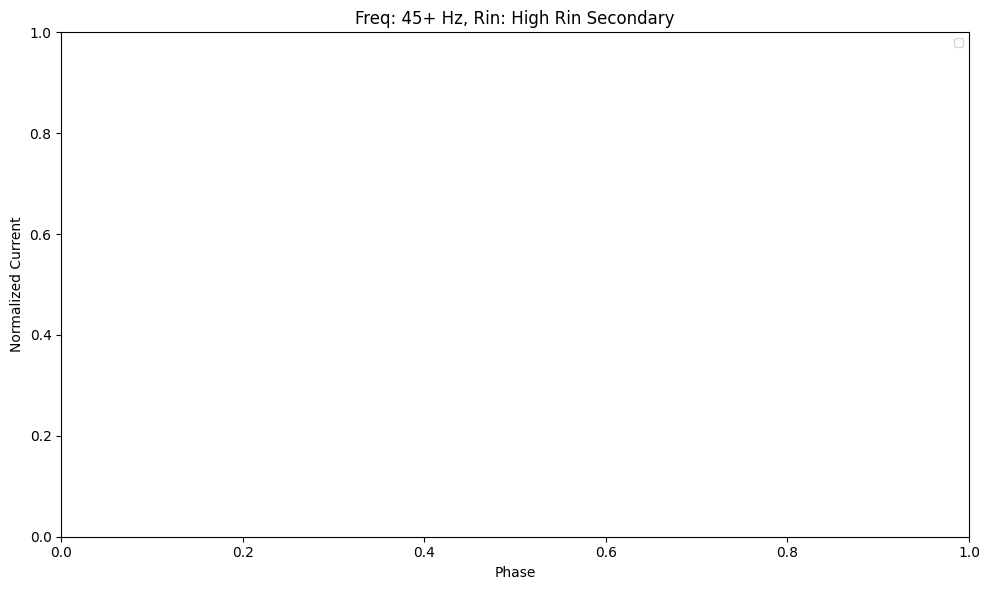

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import pandas as pd

freq_bins = ["15–25", "25–35", "35–45", "45+"]
rin_categories = ["primary", "Low Rin Secondary ", "High Rin Secondary"]
signal_types = ["Inhibitory", "Excitatory"]

# Assign unique colors to signal types
cmap = cm.get_cmap('tab10', len(signal_types))
signal_type_colors = {stype: cmap(i) for i, stype in enumerate(sorted(signal_types))}

for speed in rin_categories:
    for freq_bin in freq_bins:
        fig, ax = plt.subplots(figsize=(10, 6))
        
        # Filter keys for this freq_bin and speed, ignoring freq_bin == '<15'
        matching_keys = [key for key in binned_waveforms.keys()
                         if get_freq_bin(key[0]) == freq_bin and
                            key[3] == speed and
                            get_freq_bin(key[0]) != '<15']

        # Track labels used to avoid duplicates
        used_labels = set()
        
        for signal_type in signal_types:
            # Filter keys further by signal_type
            keys_for_signal = [k for k in matching_keys if k[1] == signal_type]
            if not keys_for_signal:
                continue
            
            # Collect dataframes for this signal_type
            dfs = [binned_waveforms[key].copy() for key in keys_for_signal]
            combined = pd.concat(dfs)
            grouped = combined.groupby('Phase Bin', observed=False)
            averaged = grouped.mean().reset_index()
            sem = grouped.sem().reset_index()

            label = signal_type if signal_type not in used_labels else None
            ax.plot(averaged['Phase'], averaged['Normalized Current'],
                    label=label, color=signal_type_colors[signal_type])
            ax.fill_between(averaged['Phase'],
                            averaged['Normalized Current'] - sem['Normalized Current'],
                            averaged['Normalized Current'] + sem['Normalized Current'],
                            color=signal_type_colors[signal_type], alpha=0.3)
            used_labels.add(signal_type)

        ax.set_title(f"Freq: {freq_bin} Hz, Rin: {speed}")
        ax.set_xlabel('Phase')
        ax.set_ylabel('Normalized Current')
        ax.legend(fontsize='small')
        plt.tight_layout()
        plt.show()
